![banner.jpeg](attachment:f9b0fb89-8415-43d0-97c5-e0cd7685cc3d.jpeg)

# Entendimiento de datos
En este notebook se abordan dos aspectos importantes para el entendimiento de un conjunto de datos, buscando responder a las necesidades de una empresa en términos de análisis de información:
* Exploración y perfilamiento de datos
    * Carga
    * Descripción básica
    * Visualización
    * Perfilamiento

* Calidad de datos e ideas de preparación
  * Completitud
  * Unicidad / Duplicidad
  * Validez / Estandarizacón
    
Para la carga y manipulación de datos se utiliza la libreria **Pandas** (https://pandas.pydata.org/) y para la visualización **Matplotlib** (https://matplotlib.org/) y **Seaborn** (https://seaborn.pydata.org/).

## Caso
SpotiAlpes es una empresa que brinda servicios gratuitos de transmisión de música y está interesada en explorar opciones para generar valor a su negocio, a partir de los datos que han recopilado a lo largo de los años. En su mente ha generado un par de preguntas que le gustaría contestar con su ayuda durante los primeros dos meses de consultoría con su empresa. Estas preguntas son: ¿Qué caracteriza una canción popular? ¿Cómo organizar canciones en grupos que faciliten el comprender qué tipo de música están compartiendo en la plataforma? ¿Qué tan bailable es una canción? SpotiAlpes ha contratado su empresa y quiere iniciar esta consultoría, identificando la capacidad que tienen algunas herramientas del mercado para generar tableros de control, en particular PowerBI y Tableau. Es así como quiere que usted genere un primer prototipo de tablero de control, utilizando alguna de esas herramientas y le brinde retroalimentación que pueda utilizar para seleccionar la herramienta a utilizar en análisis posteriores. La empresa espera como entregable: Un primer prototipo de tablero de control, que cumpla con una serie de lineamientos que está diseñando para construir ese estilo de aplicaciones. Ese primer prototipo debe:

Permitirles explorar rápidamente una serie de datos, en particular los relacionados con información de canciones, y las preguntas de interés de SpotiAlpes, Utilizar el Diccionario de datos) para una mejor comprensión de los datos y su posterior uso en analítica Describir la empresa a partir de los datos y dar ejemplos de oportunidades que tendrá al usar analítica.

## Los datos
Se trabaja con un conjunto de datos que contiene canciones de Spotify. El conjunto de datos original contiene alrededor de 600K canciones con diferentes caracteristicas musicales. Se trabaja sobre una versión alterada de estos datos. Esta versión incluye nuevas columnas que fueron creadas por un grupo de ingenieros de datos de la empresa.

Los datos originales se tomaron de : *https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks* y una versión más reciente pueden encontrarla en este enlace: *https://www.kaggle.com/datasets/luckey01/test-data-set*

In [1]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Este comando es requerido para que las visualizaciones se muestren en este notebook
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', None) # Número máximo de columnas a mostrar
pd.set_option('display.max_rows', 50) # Numero máximo de filas a mostar

# Exploración y perfilamiento de datos

## 1. Carga de los datos

In [3]:
# Lectura de datos en formato CSV
# Los datos son almacenados en memoria usando una estructura de datos de Pandas conocida como dataframe
df_tracks = pd.read_csv('./data/PrepTracks.csv')

In [4]:
# Dimensiones del dataframe
df_tracks.shape

(100000, 26)

In [5]:
# Impresión de algunos registros del dataframe
df_tracks.sample(5) # Muestra aleatoria
#df_tracks.head(5) # Primeras Filas
#df_tracks.tail(5) # Ultimas Filas

,Unnamed: 0,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,first_artist,second_artist,energy_by_ms,new_release_date,release_year,days_since_released
40164,487924,7hBovopAKYtGRFVFCRmImy,Herbs - Short Take / Remastered,2.0,210893,False,"[""Serge Chaloff""]",['1Ic9vseHq7wmDPdsZyjMdv'],1955-01-01,0.581,0.467,-6.981,M,0.0375,0.4820,0.000014,0.0294,0.643,111.478,4.0,Serge Chaloff,NaN,0.000002,1955-01-01,1955.0,24329.0
67045,413159,003IvyvD1M7gdSDK3z5Kfd,Moño Negro,36.0,143200,False,"[""Alejandro Fernández""]",['6sq1yF0OZEWA4xoXVKW1L9'],Year 1996,0.716,0.330,-11.764,m,0.0413,0.5700,0.000018,0.1380,0.554,117.835,4.0,Alejandro Fernández,NaN,0.000002,1996-01-01,1996.0,9354.0
70980,384562,0zAn9XhcdrHPxWk0kUqSRp,Meravigliosamente,27.0,225133,False,"[""Cugini Di Campagna""]",['3PxABgbDMeYxPK9GGjNg4j'],1997-01-01,0.634,0.397,-14.217,m,0.0400,0.8390,0.000334,0.2700,0.671,108.987,4.0,Cugini Di Campagna,NaN,0.000002,1997-01-01,1997.0,8988.0
10147,331496,5vRw0kz62KT0A00Eh7hykV,Life Can Turn On A Dime,24.0,172733,False,"[""Rick Trevino""]",['28yWs7I4FXiDyBuHoZqkY8'],1994-02-17,0.624,0.686,-8.755,M,0.0286,0.2400,0.000000,0.1640,0.702,81.607,4.0,Rick Trevino,NaN,0.000004,1994-02-17,1994.0,10037.0
44456,367891,67UHt51fkmhCrcV3BCAgGD,Beats time,32.0,313747,True,"[""The Stunned Guys""]",['65T2gXuk9TCJk0kuMubwXH'],1996-04-02,0.673,0.711,-11.444,M,0.0824,0.0108,0.664000,0.0953,0.101,92.888,4.0,The Stunned Guys,NaN,0.000002,1996-04-02,1996.0,9262.0


## 2. Descripción de los datos

In [6]:
# Impresión del tipo de dato asociado a cada columna
df_tracks.dtypes

Unnamed: 0               int64
id                      object
name                    object
popularity             float64
duration_ms              int64
explicit                  bool
artists                 object
id_artists              object
release_date            object
danceability           float64
energy                 float64
loudness               float64
mode                    object
speechiness            float64
acousticness           float64
instrumentalness       float64
liveness               float64
valence                float64
tempo                  float64
time_signature         float64
first_artist            object
second_artist           object
energy_by_ms           float64
new_release_date        object
release_year           float64
days_since_released    float64
dtype: object

#### 2.1 Datos numéricos

In [7]:
# Se calculan las estadísticas principales de las columnas numéricas
df_tracks.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,energy_by_ms,release_year,days_since_released
count,100000.000000,99931.000000,1.000000e+05,99908.000000,99890.000000,99881.00000,99897.000000,99903.000000,99902.000000,99904.000000,99908.000000,99913.000000,99916.000000,99890.000000,99894.000000,99894.000000
mean,284839.001020,27.508801,2.323934e+05,0.562137,0.544938,-10.12362,0.092722,0.446078,0.115597,0.209728,0.551572,118.729047,3.880179,0.000003,1988.609186,11940.835796
std,163869.960126,18.536128,1.266615e+05,0.166705,0.251733,5.09098,0.152874,0.350177,0.268697,0.181532,0.258534,29.621415,0.452536,0.000002,23.034384,8445.703666
min,3.000000,0.000000,3.344000e+03,0.000000,0.000000,-60.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1922.000000,117.000000
25%,143339.500000,12.000000,1.775070e+05,0.451000,0.347000,-12.77100,0.033800,0.091700,0.000000,0.097300,0.344000,95.965000,4.000000,0.000002,1974.000000,4971.000000
50%,285050.500000,27.000000,2.161200e+05,0.575000,0.555000,-9.14700,0.043800,0.413000,0.000029,0.136000,0.562000,117.863000,4.000000,0.000002,1993.000000,10449.000000
75%,426774.500000,41.000000,2.646000e+05,0.684000,0.750000,-6.41500,0.072900,0.784000,0.011000,0.269000,0.771000,136.483000,4.000000,0.000003,2008.000000,17389.000000
max,568556.000000,98.000000,4.792587e+06,0.985000,1.000000,2.66300,0.971000,0.996000,1.000000,1.000000,1.000000,243.372000,5.000000,0.000082,2021.000000,36382.000000


In [8]:
# Para una única columna
# En Pandas las columnas reciben el nombre de Series
df_tracks['duration_ms'].describe()

count    1.000000e+05
mean     2.323934e+05
std      1.266615e+05
min      3.344000e+03
25%      1.775070e+05
50%      2.161200e+05
75%      2.646000e+05
max      4.792587e+06
Name: duration_ms, dtype: float64

In [9]:
# También es posible calcular una estadística particular
# Note que también es posible utilizar 'dot notation' para acceder a una columna
print(df_tracks.duration_ms.mean())
print(df_tracks.duration_ms.sum())
print(df_tracks.duration_ms.std())

232393.43929
23239343929
126661.47064614165


In [10]:
# Operaciones entre columnas
# Se crea una nueva columna que representa la energia por ms
df_tracks['energy_by_ms'] = df_tracks.energy / df_tracks.duration_ms

In [11]:
# Utilizando una lista anidada es posible filtrar las columnas a mostrar
df_tracks[['name', 'energy_by_ms']]

,name,energy_by_ms
0,Under Control,3.737957e-06
1,Dile a Ella,2.808435e-06
2,Ae Bade Saba Kuchh Tune Suna,3.291534e-07
3,Ghosts 'n' Stuff,1.879648e-06
4,黄昏のビギン,1.349420e-06
...,...,...
99995,Aşığınım,3.957908e-06
99996,Brúðkaup,1.281135e-05
99997,愛染橋,1.890720e-06
99998,第一次,1.446727e-06


#### 2.2 Datos categóricos

In [12]:
# Se revisan los diferentes valores de una columna categórica con su respectiva frecuencia absoluta
df_tracks['mode'].value_counts()

M        66102
m        33722
other       31
OTHER       28
Other       28
Name: mode, dtype: int64

In [13]:
# Es posible obligar a tener en cuenta valores nulos así como retornar la frecuencia relativa en lugar de la absoluta
df_tracks['mode'].value_counts(dropna = False, normalize = True)

M        0.66102
m        0.33722
NaN      0.00089
other    0.00031
OTHER    0.00028
Other    0.00028
Name: mode, dtype: float64

#### 2.3 Datos de fechas

In [14]:
# Por defecto, Pandas carga las fechas como strings
df_tracks['new_release_date'].sample(10)

28349    2009-01-01
64536    1976-01-01
88813    2001-01-01
8481     1987-01-01
69574    1970-01-01
61134    2020-01-24
53179    1980-01-01
83086    1938-01-01
1676     2021-02-06
53295    1961-07-03
Name: new_release_date, dtype: object

In [15]:
# Por supuesto es posible transformar el tipo de dato para aplicar las funciones específicas del tipo de dato específico y comprenderlo mejor.
df_tracks['new_release_date'] = pd.to_datetime(df_tracks['new_release_date'])

In [16]:
df_tracks['new_release_date']

0       2003-10-20
1       1996-01-01
2       1945-12-31
3       2009-01-01
4       1994-01-01
           ...    
99995   2000-01-01
99996   2002-01-01
99997   2004-07-22
99998   2006-09-15
99999   1969-01-01
Name: new_release_date, Length: 100000, dtype: datetime64[ns]

## 3. Visualización de datos
Para la visualización, se puede utilizar tanto Matplotlib como Seaborn. Seaborn es una extensión de Matplotlib, permitiendo crear visualizaciones más complejas con menor esfuerzo.  
  
Para facilitar la visualización, se realiza un filtro de los 20 mejores artistas.

In [17]:
# Se realiza una agrupación por artista y se agrega sumando su popularida 
# La agrupación y agregación en Pandas es equivalente al GROUP BY en SQL
df_top = df_tracks[['first_artist', 'popularity']].groupby('first_artist').sum().sort_values('popularity', ascending = False).head(20)

In [18]:
df_top

,popularity
first_artist,
Queen,5016.0
Lata Mangeshkar,4915.0
Johann Sebastian Bach,4627.0
Taylor Swift,4345.0
S. P. Balasubrahmanyam,4172.0
The Beatles,4019.0
Fünf Freunde,3840.0
The Rolling Stones,3672.0
Wolfgang Amadeus Mozart,3478.0


In [19]:
# Se filtra el dataframe original obteniendo los registros solo de los 20 artistas más populares
df_plot = df_tracks.loc[df_tracks.first_artist.isin(df_top.index)]

In [20]:
df_plot.shape

(2842, 26)

### 1.1 Diagrama de puntos (numérico vs. numérico)

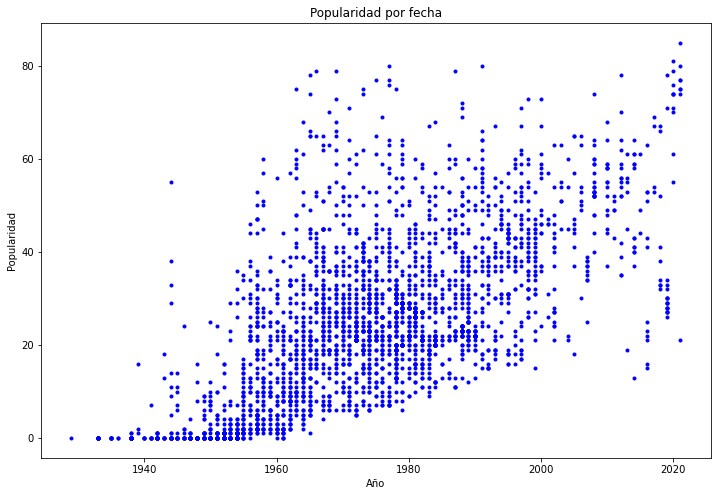

In [21]:
# Visualización de un scatter plot usando matplotlib
plt.figure(figsize = (12, 8))
plt.plot(df_plot['release_year'], df_plot['popularity'], '.', color = 'blue')
plt.title('Popularidad por fecha')
plt.xlabel('Año')  
plt.ylabel('Popularidad')  
plt.show()

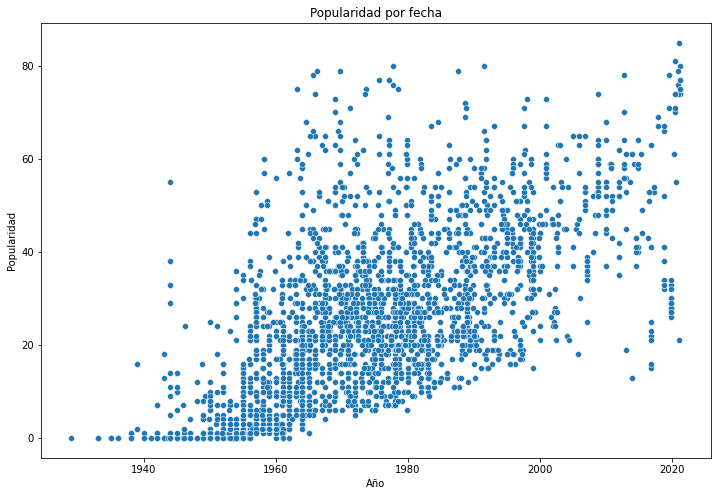

In [22]:
# Visualización de un scatter plot usando seaborn
fig = plt.figure(figsize = (12, 8))
sns.scatterplot(data = df_plot, x = 'new_release_date', y = 'popularity')
plt.title('Popularidad por fecha')
plt.xlabel('Año')  
plt.ylabel('Popularidad')  
plt.show()

### 1.2 Diagrama de cajas (numérico vs. categórico)

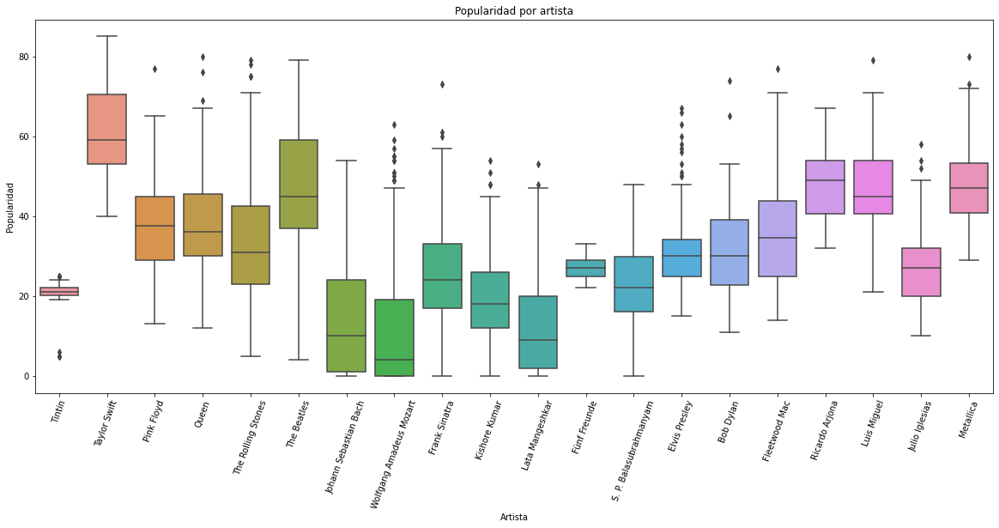

In [23]:
fig = plt.figure(figsize=(20, 8))
ax = sns.boxplot(x = 'first_artist', y = 'popularity', data = df_plot)
d = ax.set_xticklabels(ax.get_xticklabels(), rotation = 70)
plt.title('Popularidad por artista')
plt.xlabel('Artista')  
plt.ylabel('Popularidad')  
plt.show()

### 1.3 Histograma (numérico)

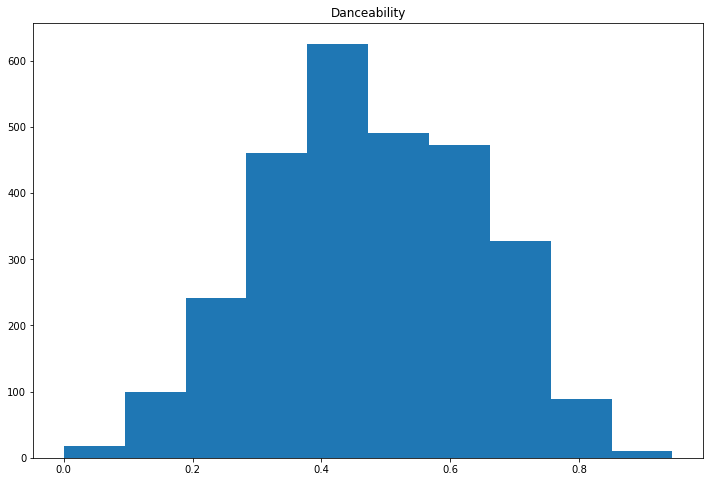

In [24]:
plt.figure(figsize = (12, 8))
plt.hist(df_plot['danceability'], bins = 10)
plt.title('Danceability')  
plt.show()

C:\Users\mavillam\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


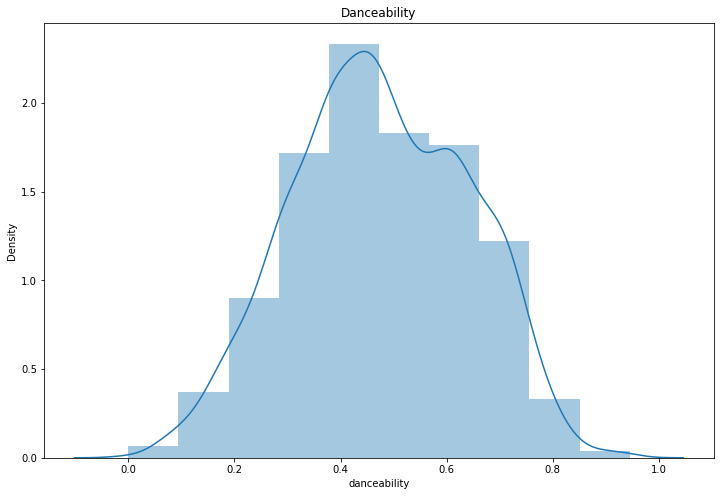

In [25]:
plt.figure(figsize = (12, 8))
plt.tight_layout()
sns.distplot(df_plot['danceability'], bins = 10)
plt.title('Danceability')  
plt.show()

### 1.4 Mapa de calor (categórico vs. categórico vs. numérico)
Un uso común del heatmap es como matriz de correlación, sin embargo se puede usar para comparar una magnitud entre dos variables categóricas.

<AxesSubplot:>

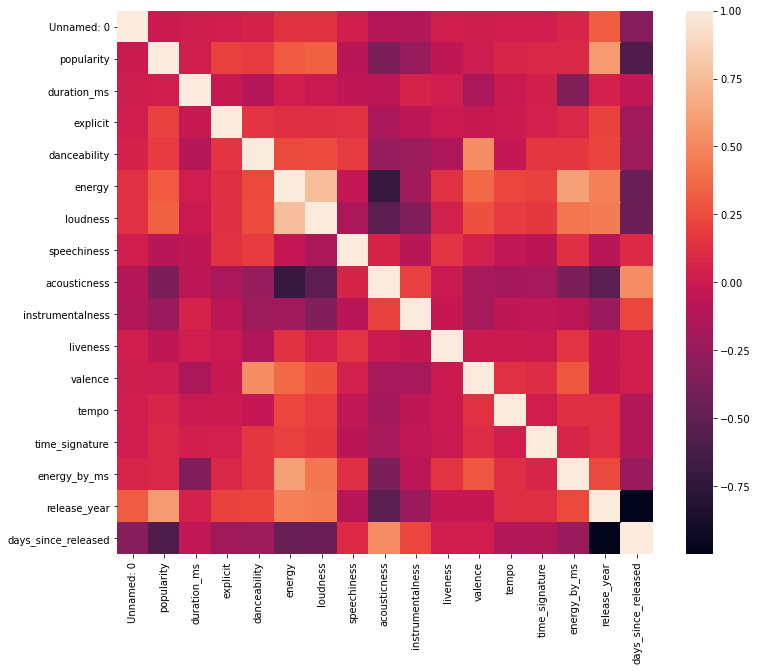

In [26]:
plt.figure(figsize = (12, 10))
sns.heatmap(df_tracks.corr())

## 2. Perfilamiento

Para realizar un perfilamiento general de los datos se puede usar la librería Pandas Profiling.

Esta librería, a partir de los tipos de datos identificados por Pandas, calcula un conjunto de estadísticas y construye algunas visualizaciones estándares para datos de tipo numérico, categórico, temporales, entre otros.

La documentación oficial de Pandas Profiling se puede encontrar aquí: [https://github.com/ydataai/pandas-profiling](https://github.com/pandas-profiling/pandas-profiling).

In [27]:
!pip install pandas-profiling --upgrade

  Attempting uninstall: visions
    Found existing installation: visions 0.7.4
    Uninstalling visions-0.7.4:
      Successfully uninstalled visions-0.7.4
  Attempting uninstall: patsy
    Found existing installation: patsy 0.5.1
    Uninstalling patsy-0.5.1:
      Successfully uninstalled patsy-0.5.1
  Attempting uninstall: packaging
    Found existing installation: packaging 20.9
    Uninstalling packaging-20.9:
      Successfully uninstalled packaging-20.9
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2
  Attempting uninstall: pandas-profiling
    Found existing installation: pandas-profiling 3.1.0
    Uninstalling pandas-profiling-3.1.0:
      Successfully uninstalled pandas-profiling-3.1.0


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sphinx 4.0.1 requires MarkupSafe<2.0, but you have markupsafe 2.0.1 which is incompatible.


In [28]:
import pandas_profiling

In [29]:
profile = pandas_profiling.ProfileReport(df_tracks)

In [30]:
# Esta parte del código puede fallar por problemas con la versión de pandas_profiling
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
# Puede revisar la documentación de la librería para averiguar como embeber el reporte generado en el notebook
# En este caso se decide exportar el reporte a un archivo HTML
profile.to_file('spotify_db_profile.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**Importante:** En general es buena idea utilizar este tipo de herramientas que automatizan algunos pasos en el proceso de exploración de datos, sin embargo, bajo ningún escenario en ejercicio de exploración se puede limitar solo al uso de esta herramienta. El análisis de los resultados obtenidos es lo más importante.

## Calidad y preparación de datos

En este punto vamos a analizar diferentes dimensiones de calidad, de acuerdo con los datos y el problema a abordar. Recuerda que el objetivo es entender cómo se encuentran los datos para determinar el esfuerzo requerido para su preparación posterior.

## 1. Completitud
Buscar registros con valores faltantes y decidir, desde el contexto del  negocio, que se puede hacer con ellos. Por lo general podemos:
* Eliminar
* Reemplazar

In [32]:
# Se calcula el porcentaje de valores vacios de cada columna
(df_tracks.isnull().sum() / df_tracks.shape[0]).sort_values(ascending = False)

second_artist          0.81850
loudness               0.00119
energy                 0.00110
energy_by_ms           0.00110
days_since_released    0.00106
release_year           0.00106
new_release_date       0.00106
id                     0.00106
release_date           0.00106
speechiness            0.00103
instrumentalness       0.00098
acousticness           0.00097
liveness               0.00096
danceability           0.00092
valence                0.00092
mode                   0.00089
tempo                  0.00087
time_signature         0.00084
name                   0.00078
popularity             0.00069
first_artist           0.00010
id_artists             0.00000
artists                0.00000
explicit               0.00000
duration_ms            0.00000
Unnamed: 0             0.00000
dtype: float64

En este punto es importante determinar opciones a plantear para la transformación de los datos. Algunas estrategias para solventar este tipo de problemas de calidad son:
- Para columnas numéricas: Imputar por la media o la mediana. También se puede imputar por estas mismas estadísticas pero calculadas a partir de una columna categórica.
- Para columnas categórcas: Imputar por la moda. También se puede imputar por esta misma estadística pero calculada a partir de otra columna categórica.

## 2. Unicidad / Duplicidad
Identificar las filas que tienen valores idénticos, ya sea en todas sus columnas o en aquellas que deben tener valores únicos, como lo puede ser el identificador o alguna combinación única de columnas: nombre de canción, artista y año.

In [33]:
# En este caso se revisan duplicados solo por id de la canción
# Se imprimen algunos de los registros duplicados para propósitos de comparación
# Recuerden que los duplicados pueden ser parciales. Esto significa que si bien para el ejemplo de las canciones tienen id diferentes, el nombre de la canción, los artistas y la fecha de lanzamiento pueden ser las mismas y de esta forma comvertirse en un registro duplicado.

df_tracks.loc[df_tracks.duplicated(subset = 'id', keep = False)].sort_values(by = 'id').head(6)

,Unnamed: 0,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,first_artist,second_artist,energy_by_ms,new_release_date,release_year,days_since_released
46950,331010,2LNaX51oF2MdWHS0VAhEO1,Sang uden refreng,11.0,213640,False,"[""Ingenting""]",['4XTkjezyU5rjlJzq3I2JKS'],1991-01-01,0.499,0.698,-13.011,M,0.0404,0.0257,0.000074,0.0361,0.754,166.828,4.0,Ingenting,NaN,0.000003,1991-01-01,1991.0,11180.0
83669,564192,2LNaX51oF2MdWHS0VAhEO1,Sang uden refreng,32.0,273987,False,"[""Ingenting""]",['4XTkjezyU5rjlJzq3I2JKS'],2003-01-01,0.627,0.443,-12.111,M,0.0290,0.5030,0.170000,0.0905,0.347,111.355,4.0,Ingenting,NaN,0.000002,2003-01-01,2003.0,6797.0
22378,53612,2hOC9qItvmSkgMnxRjgPSr,Help! - Remastered 2009,56.0,205827,False,"[""The Beatles""]",['3WrFJ7ztbogyGnTHbHJFl2'],1981-01-01,0.658,0.862,-9.963,M,0.0535,0.2110,0.000054,0.2000,0.969,169.532,4.0,The Beatles,NaN,0.000004,1981-01-01,1981.0,14832.0
59497,46529,2hOC9qItvmSkgMnxRjgPSr,Help! - Remastered 2009,40.0,140280,False,"[""The Beatles""]",['3WrFJ7ztbogyGnTHbHJFl2'],1973-04-01,0.554,0.742,-7.098,m,0.0331,0.2050,0.000000,0.0760,0.746,94.969,4.0,The Beatles,NaN,0.000005,1973-04-01,1973.0,17664.0
4,534189,2x3qb3DN9Pt1uxLeZEQtzN,黄昏のビギン,19.0,200827,False,"[""Jun Mayuzumi""]",['6354M4nd7CU1dSHwyxLzSf'],Year 1994,0.376,0.271,-12.859,M,0.0302,0.1160,0.000007,0.4670,0.300,92.953,4.0,Jun Mayuzumi,NaN,0.000001,1994-01-01,1994.0,10084.0
35533,152110,2x3qb3DN9Pt1uxLeZEQtzN,黄昏のビギン,0.0,377574,False,"[""Jun Mayuzumi""]",['6354M4nd7CU1dSHwyxLzSf'],2013-11-30,0.787,0.856,-6.529,M,0.3410,0.0255,0.000002,0.0868,0.756,127.979,4.0,Jun Mayuzumi,NaN,0.000002,2013-11-30,2013.0,2811.0


In [34]:
df_tracks.duplicated(subset = 'id', keep = False).sum()

116

In [35]:
# A nivel de transformación, para los duplicados totales (registros idénticos) se reportan a las personas del proyecto y para preparar los datos se remueven.
# ¿Por qué  crees que se pueden presentar estos duplicados?
# Pandas ofrece una función conveniente para eliminar registros duplicados
df_tracks.drop_duplicates(subset = 'id', keep = 'first', inplace = True)

In [36]:
df_tracks.duplicated(subset = 'id', keep = False).sum()

0

## 3. Consistencia
Este proceso se basa en tener conherencia entre los diferentes valores de la columna. Es decir, que:
No se tengan difrentes cadenas o números para la misma categoría en una columna con valores categóricos.


## 3.1 Categóricos


In [37]:
# Revisamos los valores de la unica variable categorica: mode
df_tracks['mode'].value_counts()

M        66027
m        33687
other       31
OTHER       28
Other       28
Name: mode, dtype: int64

In [38]:
df_tracks.loc[df_tracks['mode'].apply(lambda s: str(s).upper() == 'OTHER'),'mode'] = 'O'
df_tracks['mode'].value_counts()

M    66027
m    33687
O       87
Name: mode, dtype: int64

## 4 . Validez / Estandarización
Validez es la correctitud de un valor a nivel principalmente de formato y valor de una columna de acuerdo al contexto. Ejemplos de esta dimensión son:
* Que los números dentro de una columna categórica pertenezcan a un rango establecido.
* Que las fechas de una columna se encuentren dentro de un rango de fechas establecido.

Un caso especial de la validez es la estandarización de datos. Esta hace referencia a que la representación de de los valores de las columnas cumpla un cierto estandar a través de la organización, garantizando que se pueden juntar o comparar columnas entre diferentes tablas. De nuevo, estos estandares por lo general vienen preestablecidos y el proceso de estandarización debe simplemente acoplarse a ellos.

## 4.1 Revisión a nivel de datos **numéricos**

In [39]:
# Resumen
# A nivel del diccionario de datos nos dijeron que el dominio de loudness era 0..1 y no se cumple en los datos
number_cols = df_tracks.dtypes[(df_tracks.dtypes == np.int64) | (df_tracks.dtypes == np.float64)].index
number_cols = df_tracks.select_dtypes(include = ['int', 'float']).columns
number_cols


Index(['popularity', 'danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'energy_by_ms', 'release_year',
       'days_since_released'],
      dtype='object')

In [40]:
df_tracks[number_cols].describe()

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,energy_by_ms,release_year,days_since_released
count,99821.000000,99798.000000,99780.000000,99771.000000,99787.000000,99793.000000,99792.000000,99794.000000,99798.000000,99804.000000,99806.000000,99780.000000,99784.000000,99784.000000
mean,27.512668,0.562112,0.544958,-10.123540,0.092741,0.446060,0.115586,0.209738,0.551598,118.734558,3.880198,0.000003,1988.608424,11941.095115
std,18.538666,0.166722,0.251738,5.090989,0.152918,0.350194,0.268681,0.181540,0.258527,29.624262,0.452487,0.000002,23.035703,8446.189035
min,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1922.000000,117.000000
25%,12.000000,0.451000,0.347000,-12.771000,0.033800,0.091600,0.000000,0.097300,0.344000,95.965000,4.000000,0.000002,1974.000000,4971.000000
50%,27.000000,0.575000,0.555000,-9.147000,0.043800,0.413000,0.000029,0.136000,0.562000,117.879000,4.000000,0.000002,1993.000000,10449.000000
75%,41.000000,0.684000,0.750000,-6.415000,0.072900,0.784000,0.011000,0.269000,0.771000,136.488250,4.000000,0.000003,2008.000000,17389.000000
max,98.000000,0.985000,1.000000,2.663000,0.971000,0.996000,1.000000,1.000000,1.000000,243.372000,5.000000,0.000082,2021.000000,36382.000000


In [41]:
# Una idea para transformar el dato al dominio correcto de acuerdo con la respuesta que nos dió SpotiAlpes
min_val = df_tracks['loudness'].min()
max_val = df_tracks['loudness'].max()
df_tracks['loudness'] = (df_tracks['loudness'] - min_val)/ (max_val - min_val)

In [42]:
# Confirmar
df_tracks[['loudness']].describe()

,loudness
count,99771.000000
mean,0.795948
std,0.081244
min,0.000000
25%,0.753698
50%,0.811532
75%,0.855130
max,1.000000


## 4.2 Revisión a nivel de fechas

In [43]:
# Se espera que se genere un error al intentar convertir esta columna a fecha
pd.to_datetime(df_tracks['release_date'])

ParserError: Unknown string format: Year 1996

In [ ]:
# Durante el proceso de transformación, una forma de salir del paso es indicarle a Pandas que no levante la excepción y asigne un valor de nulo (NaT) para los casos de fechas mal formadas
# Por supuesto, lo correcto sería en la medida de lo posible encontrar una forma de corregir dichas fechas
pd.to_datetime(df_tracks['release_date'], errors = 'coerce')